In [1]:
# # Left as reference to what I did, but if you run these cells again
# # you did something wrong

# import zipfile

# files = ['/content/drive/MyDrive/Colab Notebooks/CS 224S/project/wav_clean.zip',
#          '/content/drive/MyDrive/Colab Notebooks/CS 224S/project/wav_noisy.zip']

# for f in files[-1:]:
#   with zipfile.ZipFile(f, "r") as zip_ref:
#     zip_ref.extractall("/content/drive/MyDrive/Colab Notebooks/CS 224S/project/")

# with open('/content/drive/MyDrive/Colab Notebooks/CS 224S/project/test.txt', 'r') as f:
#   with open('/content/drive/MyDrive/Colab Notebooks/CS 224S/project/val.txt', 'w') as fw:
#     for line in f.readlines():
#       new = line.replace("VoiceBank+DEMAND/", "")
#       fw.write(new)

# with open('/content/drive/MyDrive/Colab Notebooks/CS 224S/project/training.txt', 'r') as f:
#   with open('/content/drive/MyDrive/Colab Notebooks/CS 224S/project/train.txt', 'w') as fw:
#     for line in f.readlines():
#       new = line.replace("VoiceBank+DEMAND/", "")
#       fw.write(new)

# with open('training.txt', 'r') as f:
#   with open('tinytrain.txt', 'w') as fw:
#     for line in f.readlines()[:50]:
#       new = line.replace("VoiceBank+DEMAND/", "")
#       fw.write(new)

# with open('test.txt', 'r') as f:
#   with open('tinyval.txt', 'w') as fw:
#     for line in f.readlines()[:10]:
#       new = line.replace("VoiceBank+DEMAND/", "")
#       fw.write(new)

In [2]:
# (Maybe this is needed)
# !pip install torchmetrics
!pip install torchmetrics[audio]
!pip install torch-pesq
!pip install typeguard
!pip install pesq

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 868.8/868.8 kB 9.0 MB/s eta 0:00:00
  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (23.7 MB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (823 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (14.1 MB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl (731.7 MB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl (410.6 MB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl (121.6 MB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl (56.5 MB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl (124.2 MB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manylinux1_x86_64.whl (196.0 MB)
  Using cached nvidia_nccl_cu12-2.20.5-py3-none-manylinux2014_x86_64.whl (176.2 MB)
  Using cached nvidia_nvtx_cu12-12.1.105-py3-none-m

In [4]:
from google.colab import drive
drive.mount('/content/drive')

%cd "drive/MyDrive/Colab Notebooks/CS 224S/project/"

Mounted at /content/drive
/content/drive/.shortcut-targets-by-id/1vwTAlLr6YaZczAZyOOT_yIyjnPiqvWZa/project


In [5]:
import torch
import random
import librosa
from torch import nn
import torch.nn.functional as F
import matplotlib.pyplot as plt
from pesq import pesq
import os
from torch.optim import Adam, lr_scheduler
import IPython.display as ipd
from torch.utils.data import DataLoader
from torch.utils.tensorboard import SummaryWriter
from torch import tensor
from tqdm import tqdm
from torchmetrics.audio import ScaleInvariantSignalDistortionRatio
from torchmetrics.audio import pesq
from pesq import pesq

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [6]:
# The functions in this cell are taken from MP-SENet https://github.com/yxlu-0102/MP-SENet/blob/main/datasets/dataset.py
# We do not claim credit for any of this code.

def mag_pha_stft(y, n_fft, hop_size, win_size, compress_factor=1.0, center=True):

    hann_window = torch.hann_window(win_size).to(y.device)
    stft_spec = torch.stft(y, n_fft, hop_length=hop_size, win_length=win_size, window=hann_window,
                           center=center, pad_mode='reflect', normalized=False, return_complex=True)
    mag = torch.abs(stft_spec)
    pha = torch.angle(stft_spec)
    # Magnitude Compression
    mag = torch.pow(mag, compress_factor)
    com = torch.stack((mag*torch.cos(pha), mag*torch.sin(pha)), dim=-1)

    return mag, pha, com


def mag_pha_istft(mag, pha, n_fft, hop_size, win_size, compress_factor=1.0, center=True):
    # Magnitude Decompression
    mag = torch.pow(mag, int(1.0/compress_factor))
    com = torch.complex(mag*torch.cos(pha), mag*torch.sin(pha))
    hann_window = torch.hann_window(win_size).to(com.device)
    wav = torch.istft(com,
                      n_fft,
                      hop_length=hop_size,
                      win_length=win_size,
                      window=hann_window,
                      center=center,
                      length=31999)

    return wav

def get_dataset_filelist(args):
    with open(args['input_training_file'], 'r', encoding='utf-8') as fi:
        training_indexes = [x.split('|')[0] for x in fi.read().split('\n') if len(x) > 0]

    with open(args['input_validation_file'], 'r', encoding='utf-8') as fi:
        validation_indexes = [x.split('|')[0] for x in fi.read().split('\n') if len(x) > 0]

    return training_indexes, validation_indexes

class Dataset(torch.utils.data.Dataset):
    def __init__(self, training_indexes, clean_wavs_dir, noisy_wavs_dir, segment_size, n_fft, hop_size, win_size,
                sampling_rate, compress_factor, split=True, shuffle=True, n_cache_reuse=1, device=None):
        self.audio_indexes = training_indexes
        random.seed(1234)
        if shuffle:
            random.shuffle(self.audio_indexes)
        self.clean_wavs_dir = clean_wavs_dir
        self.noisy_wavs_dir = noisy_wavs_dir
        self.segment_size = segment_size
        self.sampling_rate = sampling_rate
        self.split = split
        self.n_fft = n_fft
        self.hop_size = hop_size
        self.win_size = win_size
        self.compress_factor = compress_factor
        self.cached_clean_wav = None
        self.cached_noisy_wav = None
        self.n_cache_reuse = n_cache_reuse
        self._cache_ref_count = 0
        self.device = device

    def __getitem__(self, index):
        filename = self.audio_indexes[index]
        if self._cache_ref_count == 0:
            # print(os.path.join(self.clean_wavs_dir, filename + '.wav'))
            clean_audio, _ = librosa.load(os.path.join(self.clean_wavs_dir, filename + '.wav'), sr = self.sampling_rate)
            noisy_audio, _ = librosa.load(os.path.join(self.noisy_wavs_dir, filename + '.wav'), sr = self.sampling_rate)
            self.cached_clean_wav = clean_audio
            self.cached_noisy_wav = noisy_audio
            self._cache_ref_count = self.n_cache_reuse
        else:
            clean_audio = self.cached_clean_wav
            noisy_audio = self.cached_noisy_wav
            self._cache_ref_count -= 1

        clean_audio, noisy_audio = torch.FloatTensor(clean_audio), torch.FloatTensor(noisy_audio)
        norm_factor = torch.sqrt(len(noisy_audio) / torch.sum(noisy_audio ** 2.0))
        clean_audio = (clean_audio * norm_factor).unsqueeze(0)
        noisy_audio = (noisy_audio * norm_factor).unsqueeze(0)

        assert clean_audio.size(1) == noisy_audio.size(1)

        if self.split:
            if clean_audio.size(1) >= self.segment_size:
                max_audio_start = clean_audio.size(1) - self.segment_size
                audio_start = random.randint(0, max_audio_start)
                clean_audio = clean_audio[:, audio_start: audio_start+self.segment_size]
                noisy_audio = noisy_audio[:, audio_start: audio_start+self.segment_size]
            else:
                clean_audio = torch.nn.functional.pad(clean_audio, (0, self.segment_size - clean_audio.size(1)), 'constant')
                noisy_audio = torch.nn.functional.pad(noisy_audio, (0, self.segment_size - noisy_audio.size(1)), 'constant')

        clean_mag, clean_pha, clean_com = mag_pha_stft(clean_audio, self.n_fft, self.hop_size, self.win_size, self.compress_factor) #[1, n_fft/2+1, frames]
        noisy_mag, noisy_pha, noisy_com = mag_pha_stft(noisy_audio, self.n_fft, self.hop_size, self.win_size, self.compress_factor) #[1, n_fft/2+1, frames]

        return (clean_audio.squeeze(), clean_mag.squeeze(), clean_pha.squeeze(), clean_com.squeeze(), noisy_mag.squeeze(), noisy_pha.squeeze())

    def __len__(self):
        return len(self.audio_indexes)

In [7]:
# The args dictionary which also has config stuff
a = {
    'input_training_file' : 'tinytrain.txt',
    'input_validation_file' : 'tinyval.txt',
    'input_clean_wavs_dir' : 'wav_clean',
    'input_noisy_wavs_dir' : 'wav_noisy',
    'checkpoint_path' : 'drive/MyDrive/Colab Notebooks/CS 224S/project/runs',

    'compress_factor' : 0.3,
    'sampling_rate': 16000,
    'segment_size': 32000 - 1,
    'n_fft': 400 - 2,
    'hop_size': 100,
    'win_size': 400 - 2,
    'batch_size': 2,
}
training_indexes, validation_indexes = get_dataset_filelist(a)

trainset = Dataset(training_indexes,
                   a['input_clean_wavs_dir'],
                   a['input_noisy_wavs_dir'],
                   a['segment_size'],
                   a['n_fft'],
                   a['hop_size'],
                   a['win_size'],
                   a['sampling_rate'],
                   a['compress_factor'],
                   split=True,
                   n_cache_reuse=0,
                   shuffle=True,
                   device=device)


train_loader = DataLoader(trainset, shuffle=False,
                          batch_size=a['batch_size'],
                          pin_memory=True,
                          drop_last=True)

validset = Dataset(validation_indexes,
                   a['input_clean_wavs_dir'],
                   a['input_noisy_wavs_dir'],
                   a['segment_size'],
                   a['n_fft'],
                   a['hop_size'],
                   a['win_size'],
                   a['sampling_rate'],
                   a['compress_factor'],
                   split=True,
                   shuffle=False,
                   n_cache_reuse=0,
                   device=device)

validation_loader = DataLoader(validset,
                               shuffle=False,
                               sampler=None,
                               batch_size=1,
                               pin_memory=True,
                               drop_last=True)

sw = SummaryWriter(os.path.join(a['checkpoint_path'], 'logs'))

clean_audio, clean_mag, clean_pha, clean_com, noisy_mag, noisy_pha = trainset[0]
print(f'Input data shape: {noisy_mag.shape}')

ipd.Audio(clean_audio, rate = a['sampling_rate'])

Input data shape: torch.Size([200, 320])


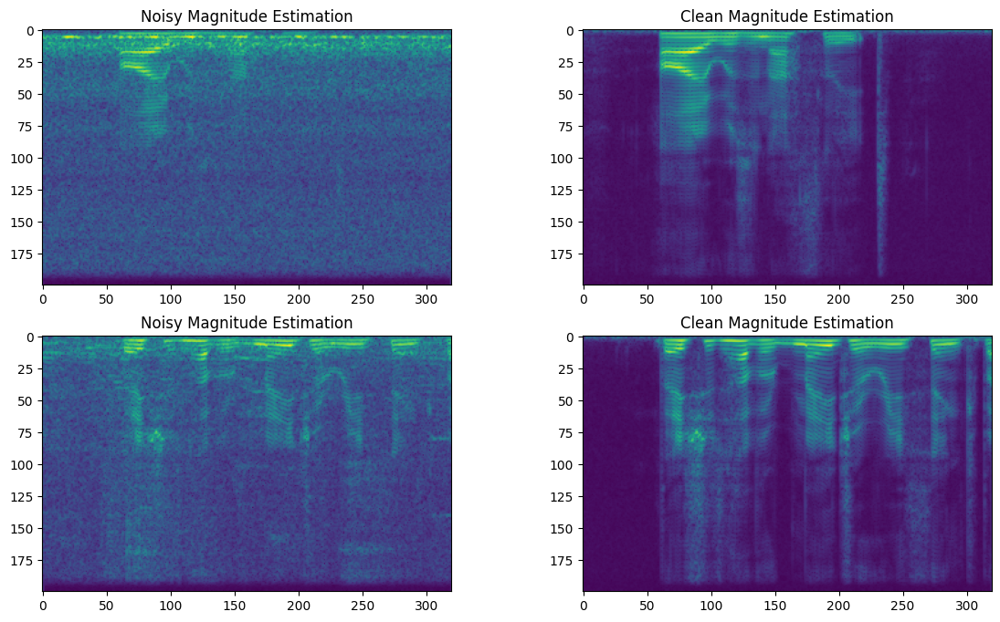

In [8]:
fig, axs = plt.subplots(2, 2, figsize=(14, 8))
axs[0, 0].imshow(noisy_mag)
axs[0, 0].set_title("Noisy Magnitude Estimation")
axs[0, 1].imshow(clean_mag)
axs[0, 1].set_title("Clean Magnitude Estimation")

clean_audio1, clean_mag1, clean_pha1, clean_com1, noisy_mag1, noisy_pha1 = trainset[1]


axs[1, 0].imshow(noisy_mag1)
axs[1, 0].set_title("Noisy Magnitude Estimation")
axs[1, 1].imshow(clean_mag1)
_ = axs[1, 1].set_title("Clean Magnitude Estimation")

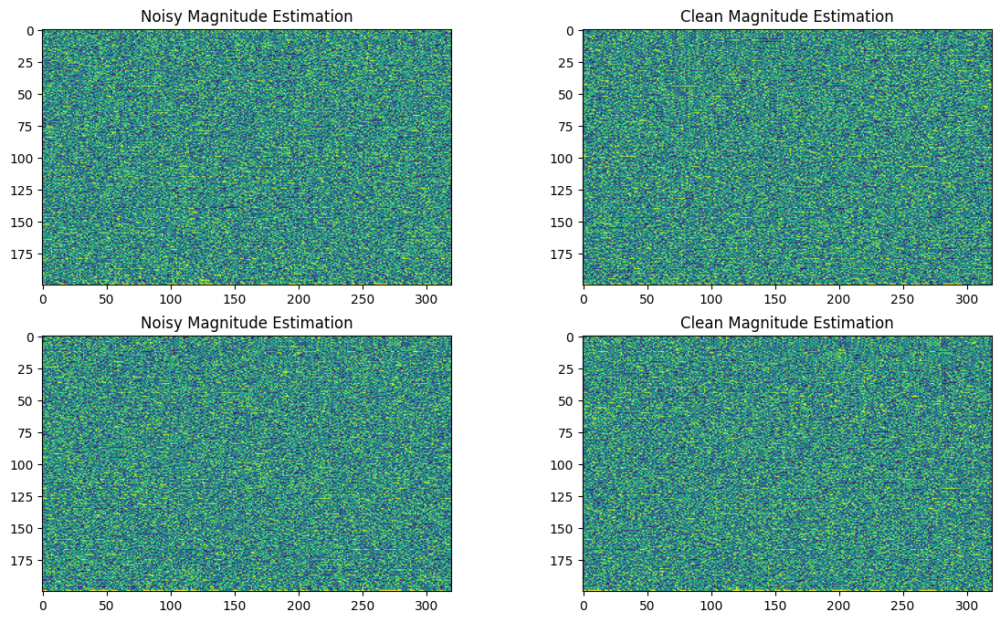

In [9]:
# Also visualize phase information

fig, axs = plt.subplots(2, 2, figsize=(14, 8))
axs[0, 0].imshow(noisy_pha)
axs[0, 0].set_title("Noisy Magnitude Estimation")
axs[0, 1].imshow(clean_pha)
axs[0, 1].set_title("Clean Magnitude Estimation")

clean_audio1, clean_mag1, clean_pha1, clean_com1, noisy_mag1, noisy_pha1 = trainset[1]


axs[1, 0].imshow(noisy_pha1)
axs[1, 0].set_title("Noisy Magnitude Estimation")
axs[1, 1].imshow(clean_pha1)
_ = axs[1, 1].set_title("Clean Magnitude Estimation")

In [ ]:
class ResBlock(nn.Module):
    def __init__(self, ch = 32):
        super(ResBlock, self).__init__()
        self.conv1 = nn.Conv2d(ch, ch, kernel_size=3, stride=1, padding=1, bias=False)
        self.bn1 = nn.InstanceNorm2d(ch)
        self.relu = nn.ReLU()
        self.conv2 = nn.Conv2d(ch, ch, kernel_size=3, stride=1, padding=1, bias=False)
        self.bn2 = nn.InstanceNorm2d(ch)

    def forward(self, inp):
        out = self.conv1(inp)
        out = self.bn1(out)
        out = self.relu(out)

        out = self.conv2(out)
        out = self.bn2(out)


        out += inp
        out = self.relu(out)

        return out

class SmallCNN(nn.Module):
    def __init__(self, tdim):
        super(SmallCNN, self).__init__()
        self.mod = nn.Sequential(
            nn.Conv2d(1, 32, kernel_size=3, stride=1, padding=1),
            nn.ReLU(),
            ResBlock(),
            # ResBlock(),
            # ResBlock(),
            nn.MaxPool2d(2, 2),
            nn.Conv2d(32, 16, kernel_size=3, stride=1, padding=1),
            nn.ReLU(),
            nn.Flatten(),
            nn.Linear(16 * 100 * 20, tdim)
        )

    def forward(self, x):
        x = x.view(x.shape[0], 1, *x.shape[1:])
        x = self.mod(x)
        return x


# first_part = SmallCNN(768)
# out = first_part(noisy_mag[None, :, :40])
# out.shape

In [ ]:
class SmallTransformer(nn.Module):
    def __init__(self, tdim, nhead, num_layers):
        super(SmallTransformer, self).__init__()
        specs = nn.TransformerEncoderLayer(d_model=tdim,
                                           nhead=nhead,
                                           batch_first=True)
        self.encoder = nn.TransformerEncoder(specs, num_layers=num_layers)

    def forward(self, x):
        x = self.encoder(x)
        return x

In [ ]:
class UpsampleNet(nn.Module):
    def __init__(self, tdim, nchunks):
        super(UpsampleNet, self).__init__()
        self.embedding_size = tdim * nchunks

        self.linear = nn.Linear(self.embedding_size, 64 * 25 * 40) # 64 chunks

        self.conv_transpose1 = nn.ConvTranspose2d(64, 32,
                                                  kernel_size=3,
                                                  stride=2,
                                                  padding=1,
                                                  output_padding=1)

        self.ino = nn.InstanceNorm2d(32, affine=True)
        self.prelu = nn.PReLU(32)

        self.conv_transpose2 = nn.ConvTranspose2d(32, 16,
                                                  kernel_size=3,
                                                  stride=2,
                                                  padding=1,
                                                  output_padding=1)

        self.inot = nn.InstanceNorm2d(16, affine=True)
        self.prelut = nn.PReLU(16)

        self.conv_transpose3 = nn.ConvTranspose2d(16, 8,
                                                  kernel_size=3,
                                                  stride=2,
                                                  padding=1,
                                                  output_padding=1)

        self.convagain = nn.Conv2d(8, 1, 1)
        self.sigmoid = nn.Sigmoid()

        self.mod = nn.Sequential(
            self.conv_transpose1,
            self.ino,
            self.prelu,
            self.conv_transpose2,
            self.inot,
            self.prelut,
            self.conv_transpose3,
            self.convagain,
            self.sigmoid
        )

    def forward(self, x):
        x = self.linear(x)

        # Reshape to (batch_size, channels, height, width)
        x = x.view(-1, 64, 25, 40)

        # Apply Conv2dTranspose layers for upsampling
        x = self.mod(x)

        return x

# inp = torch.randn(1, 8 * 768)
# model = UpsampleNet(8, 768)
# out = model(inp)
# out.shape

In [ ]:
# Also taken from the MP-SENET paper, we claim no credit for this function
class LearnableSigmoid_2d(nn.Module):
    def __init__(self, in_features, beta=1.):
        super().__init__()
        self.beta = beta
        self.slope = nn.Parameter(torch.ones(in_features, 1))
        self.slope.requiresGrad = True

    def forward(self, x):
        return self.beta * torch.sigmoid(self.slope * x)

In [ ]:
class MagnitudeDenoiser(nn.Module):
    def __init__(self, tdim=768, nchunks=8, nhead=4, num_layers=4):
        super(MagnitudeDenoiser, self).__init__()
        self.nchunks = 8 # must divide width of input, 320
        self.cnn = SmallCNN(tdim)
        self.transformer = SmallTransformer(tdim, nhead, num_layers)
        self.upsampler = UpsampleNet(tdim, nchunks)

    def forward(self, noisy_mag, noisy_pha):
        # input x.shape is batch, height, width
        B, H, W = noisy_mag.shape

        x = torch.chunk(noisy_mag, chunks=self.nchunks, dim=2) # NCH * (B, H, W // NCH)
        x = torch.cat(x, dim=0) # (NCH * B, H, W // NCH)
        x = self.cnn(x) # (NCH * B, T_dim)
        x = x.view(B, self.nchunks, -1) # (B, NCH, T_dim)


        x = self.transformer(x)
        x = x.view(B, -1) # concatenate all chunks (B, T_dim * NCH)


        x = self.upsampler(x) # (B, 1, H, W)

        mag_mask = x.squeeze(dim=1) # (B, H, W)

        # print(torch.isnan(x).any())
        pred_mag = mag_mask * noisy_mag

        wav = mag_pha_istft(mag_mask * noisy_mag,
                            noisy_pha,
                            a['n_fft'],
                            a['hop_size'],
                            a['win_size'],
                            a['compress_factor'])

        # print(torch.isnan(wav).any())
        # assert False
        return wav, pred_mag, mag_mask

In [ ]:
si_sdr_loss = ScaleInvariantSignalDistortionRatio().to(device)
mse = nn.MSELoss()

optimizer = Adam(model.parameters(), lr=5e-4)
scheduler = lr_scheduler.ReduceLROnPlateau(optimizer)
model.train()

best_pesq = 0

for epoch in tqdm(range(20)):
    train_loss = 0
    train_mean_pesq = 0
    model.train()
    for batch in train_loader:
        clean_audio, clean_mag, clean_pha, clean_com, noisy_mag, noisy_pha = batch

        clean_audio = clean_audio.to(device)
        clean_mag = clean_mag.to(device)
        clean_pha = clean_pha.to(device)
        clean_com = clean_com.to(device)
        noisy_mag = noisy_mag.to(device)
        noisy_pha = noisy_pha.to(device)

        y_pred, pred_mag, _ = model(noisy_mag, noisy_pha)
        # This loss is between predicted magnitude and clean magnitude
        loss = mse(pred_mag, clean_mag)
        # This loss is for audio quality, it may have been a bad objective fn.
        # loss += 0.2 * si_sdr_loss(y_pred, clean_audio)
        # Currently don't want to calculate train pesq cuz its just too time consuming
        train_loss += loss.item()
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

    print(f'\nTraining Epoch {epoch} Average Si-SDR loss: \
    {train_loss / len(train_loader)}')# \
    # Average PESQ: {train_mean_pesq / len(train_loader.dataset)}')

    val_loss = 0
    mse_loss = 0
    sdr_loss = 0
    mean_pesq = 0
    model.eval()
    for batch in validation_loader:
        clean_audio, clean_mag, clean_pha, clean_com, noisy_mag, noisy_pha = batch

        clean_audio = clean_audio.to(device)
        clean_mag = clean_mag.to(device)
        clean_pha = clean_pha.to(device)
        clean_com = clean_com.to(device)
        noisy_mag = noisy_mag.to(device)
        noisy_pha = noisy_pha.to(device)

        y_pred, pred_mag, _ = model(noisy_mag, noisy_pha)

        mse_loss += mse(pred_mag, clean_mag).item()
        sdr_loss += si_sdr_loss(y_pred, clean_audio).item()
        val_loss += mse_loss + sdr_loss
        for j in range(y_pred.shape[0]):
            try:
                mean_pesq += pesq(fs = a['sampling_rate'],
                            ref = clean_audio[j].cpu().detach().numpy(),
                            deg = y_pred[j].cpu().detach().numpy(),
                            mode = 'wb')
            except:
                pass

    if mean_pesq > best_pesq:
        best_pesq = mean_pesq
        torch.save(model.state_dict(), f'./ckpts/pesq_{best_pesq}.pt')

    val_loss /= len(validation_loader.dataset)
    print(f'\nValidation Epoch {epoch} Average loss: {val_loss} \
    Average PESQ: {mean_pesq / len(validation_loader)}')

    sw.add_scalar("Training/Loss", train_loss / len(train_loader), epoch)
    # sw.add_scalar("Training/Mean PESQ", train_mean_pesq, epoch)
    sw.add_scalar("Validation/Loss", val_loss, epoch)
    sw.add_scalar("Validation/Si-SDR Loss", sdr_loss, epoch)
    sw.add_scalar("Validation/MSE Loss", mse_loss, epoch)
    sw.add_scalar("Validation/Mean PESQ", mean_pesq, epoch)

    scheduler.step(val_loss)


  0%|          | 0/20 [00:00<?, ?it/s]


Training Epoch 0 Average Si-SDR loss:     0.16724254816770553


  5%|▌         | 1/20 [01:16<24:19, 76.80s/it]


Validation Epoch 0 Average loss: 50.215201592445375     Average PESQ: 1.9054625630378723

Training Epoch 1 Average Si-SDR loss:     0.1494655179977417


 10%|█         | 2/20 [01:40<13:36, 45.34s/it]


Validation Epoch 1 Average loss: 55.329353504627946     Average PESQ: 1.9409464359283448

Training Epoch 2 Average Si-SDR loss:     0.13394571870565414


 15%|█▌        | 3/20 [01:58<09:17, 32.82s/it]


Validation Epoch 2 Average loss: 54.97655128389597     Average PESQ: 1.9686335921287537

Training Epoch 3 Average Si-SDR loss:     0.13401341170072556


 20%|██        | 4/20 [02:20<07:36, 28.54s/it]


Validation Epoch 3 Average loss: 58.47393345311284     Average PESQ: 1.987496304512024

Training Epoch 4 Average Si-SDR loss:     0.1284632083773613


 25%|██▌       | 5/20 [02:42<06:32, 26.20s/it]


Validation Epoch 4 Average loss: 56.9290932521224     Average PESQ: 1.9972425818443298

Training Epoch 5 Average Si-SDR loss:     0.12959155738353728


 30%|███       | 6/20 [03:03<05:42, 24.49s/it]


Validation Epoch 5 Average loss: 58.57401532456279     Average PESQ: 2.0207433104515076

Training Epoch 6 Average Si-SDR loss:     0.12555932193994523


 35%|███▌      | 7/20 [03:11<04:08, 19.09s/it]


Validation Epoch 6 Average loss: 58.924940245598556     Average PESQ: 2.0060579657554625

Training Epoch 7 Average Si-SDR loss:     0.12288540542125702


 40%|████      | 8/20 [03:17<03:01, 15.15s/it]


Validation Epoch 7 Average loss: 59.03379266187549     Average PESQ: 1.959292435646057

Training Epoch 8 Average Si-SDR loss:     0.12232178479433059


 45%|████▌     | 9/20 [03:24<02:17, 12.50s/it]


Validation Epoch 8 Average loss: 59.28097663372755     Average PESQ: 1.9478947877883912

Training Epoch 9 Average Si-SDR loss:     0.12644042193889618


 50%|█████     | 10/20 [03:30<01:45, 10.56s/it]


Validation Epoch 9 Average loss: 54.434960912913084     Average PESQ: 2.001206839084625

Training Epoch 10 Average Si-SDR loss:     0.12115912973880767


 55%|█████▌    | 11/20 [03:37<01:24,  9.41s/it]


Validation Epoch 10 Average loss: 53.64163861200213     Average PESQ: 1.9339943528175354

Training Epoch 11 Average Si-SDR loss:     0.13341371297836305


 60%|██████    | 12/20 [03:43<01:07,  8.45s/it]


Validation Epoch 11 Average loss: 54.579197495430705     Average PESQ: 1.9765053987503052

Training Epoch 12 Average Si-SDR loss:     0.12091349124908447


 65%|██████▌   | 13/20 [03:50<00:55,  7.91s/it]


Validation Epoch 12 Average loss: 57.277405774593355     Average PESQ: 2.014995241165161

Training Epoch 13 Average Si-SDR loss:     0.12841749906539918


 70%|███████   | 14/20 [03:56<00:44,  7.42s/it]


Validation Epoch 13 Average loss: 58.17316755652428     Average PESQ: 2.0124049186706543

Training Epoch 14 Average Si-SDR loss:     0.12702073097229005


 75%|███████▌  | 15/20 [04:20<01:01, 12.25s/it]


Validation Epoch 14 Average loss: 56.94228175878525     Average PESQ: 2.0387617349624634

Training Epoch 15 Average Si-SDR loss:     0.12378259807825089


 80%|████████  | 16/20 [04:26<00:41, 10.44s/it]


Validation Epoch 15 Average loss: 56.95104514807463     Average PESQ: 2.0267706990242003

Training Epoch 16 Average Si-SDR loss:     0.1278870514035225


 85%|████████▌ | 17/20 [04:33<00:27,  9.32s/it]


Validation Epoch 16 Average loss: 54.07275188863277     Average PESQ: 1.9701088666915894

Training Epoch 17 Average Si-SDR loss:     0.12291753500699996


 90%|█████████ | 18/20 [04:39<00:16,  8.41s/it]


Validation Epoch 17 Average loss: 53.260686033964156     Average PESQ: 1.9716205835342406

Training Epoch 18 Average Si-SDR loss:     0.12437846928834916


 95%|█████████▌| 19/20 [04:46<00:07,  7.88s/it]


Validation Epoch 18 Average loss: 57.729532981663944     Average PESQ: 1.9869376420974731

Training Epoch 19 Average Si-SDR loss:     0.12795542031526566


100%|██████████| 20/20 [04:52<00:00, 14.62s/it]


Validation Epoch 19 Average loss: 56.59402194842696     Average PESQ: 1.9832926034927367


In [ ]:
sw.log_dir

'drive/MyDrive/Colab Notebooks/CS 224S/project/runs/logs'

In [ ]:
sw.close()
%load_ext tensorboard
%tensorboard --logdir="drive/MyDrive/Colab Notebooks/CS 224S/project/runs/logs"

Output hidden; open in https://colab.research.google.com to view.

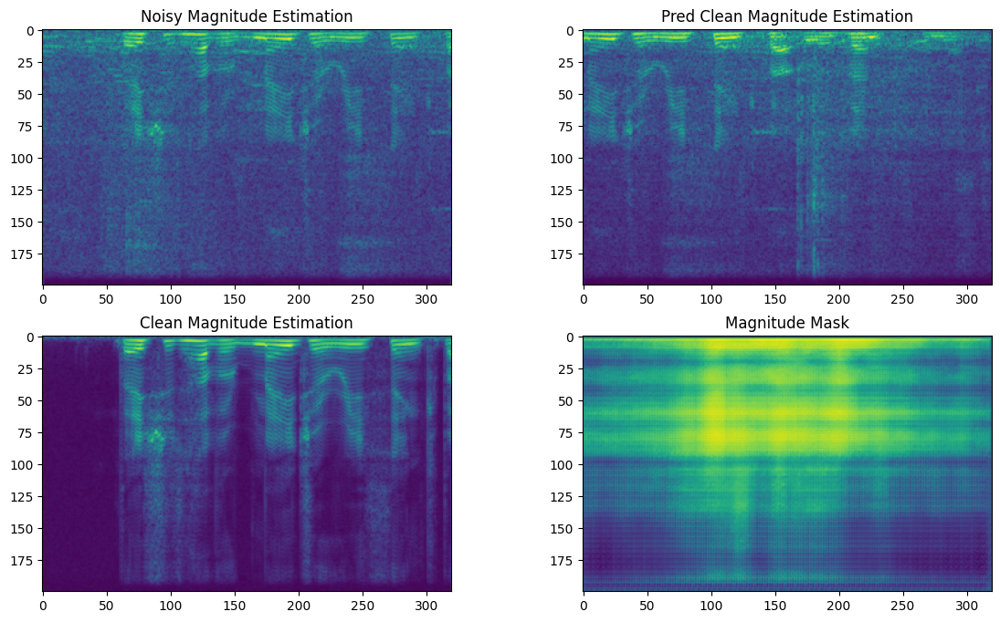

In [ ]:
fig, axs = plt.subplots(2, 2, figsize=(14, 8))


clean_audio, clean_mag, clean_pha, clean_com, noisy_mag, noisy_pha = trainset[1]

clean_audio = clean_audio.to(device)
clean_mag = clean_mag.to(device)
clean_pha = clean_pha.to(device)
clean_com = clean_com.to(device)
noisy_mag = noisy_mag.to(device)
noisy_pha = noisy_pha.to(device)

model.eval()
pred_clean_audio, pred_clean_mag, mag_mask = model(noisy_mag[None, :, :], noisy_pha[None, :, :])

pred_clean_audio = pred_clean_audio.squeeze(0)
pred_clean_mag = pred_clean_mag.squeeze(0)
mag_mask = mag_mask.squeeze(0)

axs[0, 0].imshow(noisy_mag1)
axs[0, 0].set_title("Noisy Magnitude Estimation")
axs[0, 1].imshow(pred_clean_mag.cpu().detach().numpy())
axs[0, 1].set_title("Pred Clean Magnitude Estimation")
axs[1, 0].imshow(clean_mag1)
axs[1, 0].set_title("Clean Magnitude Estimation")
axs[1, 1].imshow(mag_mask.cpu().detach().numpy())
axs[1, 1].set_title("Magnitude Mask")

ipd.Audio(pred_clean_audio.cpu().detach().numpy(), rate = a['sampling_rate'])

In [ ]:
ipd.Audio(clean_audio1, rate = a['sampling_rate'])